In [1]:
%load_ext autoreload
%autoreload 2

# LensBoy quickstart

This notebook shows you how to use lensboy to calibrate a camera, and verify it using the analysis tools.

In [2]:
import lensboy as lb
import lensboy.analysis as lba
import cv2
import imageio.v3 as iio
import mediapy
from pathlib import Path

First, load the images, and look at an example image.

""

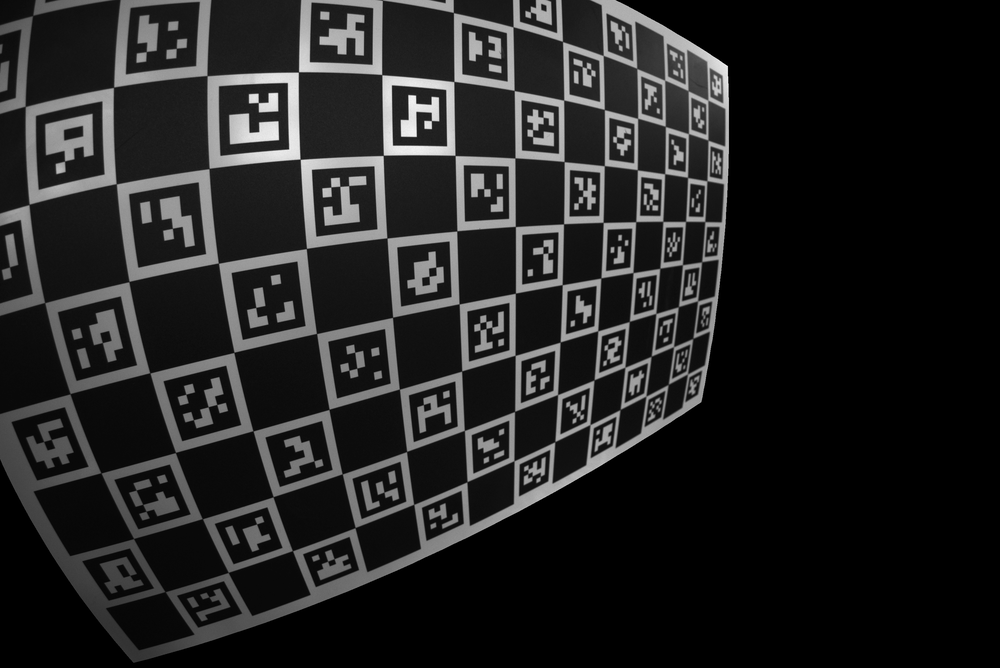

In [3]:
img_directory = Path("../data/images/wide_angle_charuco_private")
img_paths = img_directory.glob("*.png")
imgs = [iio.imread(pth) for pth in img_paths]

# if you're running the notebook yourself, you can use this for synthetic images
# from lensboy.demo import make_synthetic_images
# imgs = make_synthetic_images()

mediapy.show_image(imgs[0], width=1000)

Don't worry about the black region outside the target - I used a previous calibration to black it out for privacy reasons.

Here I'm using a charuco board to calibrate a wide-angle camera. lensboy makes it relatively easy to extract charuco detections.

In [4]:
board = cv2.aruco.CharucoBoard(
    (14, 9), 40, 30, cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_5X5_100)
)
target_points, frames, img_indices = lb.extract_frames_from_charuco(board, imgs)
used_imgs = [imgs[i] for i in img_indices]

Detecting charuco: 101/101 (100.0%)
Detected charuco in 101/101 images


In [5]:
img_height, img_width = used_imgs[0].shape[:2]
img_height, img_width

(2064, 3088)

Let's see how well our data covers the image space:

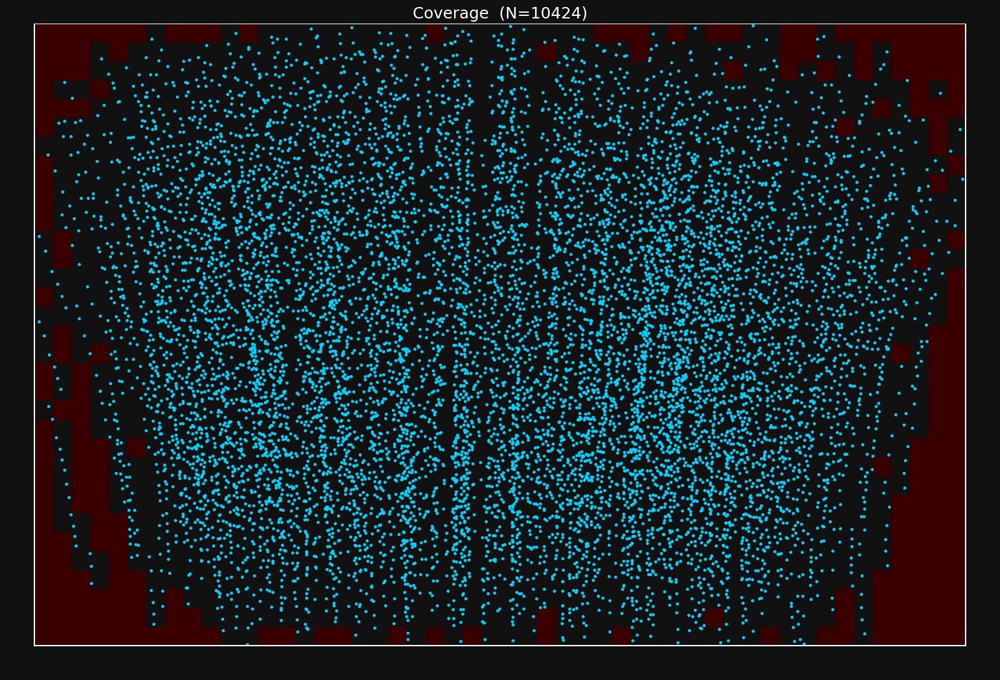

In [6]:
lba.plot_detection_coverage(frames, image_width=img_width, image_height=img_height)

Pretty good, especially for such a wide-angle camera.



# Calibrate (OpenCV)

We'll start by fitting an opencv-compatible model to this camera. 
OpenCV models are compatible with almost all standard tools, and are perfectly fine for most applications.

I'll go ahead and use all available distortion coefficients.

In [7]:
camera_model_config = lb.OpenCVConfig(
    image_height=img_height,
    image_width=img_width,
    # all distortion coefficients
    included_distortion_coefficients=lb.OpenCVConfig.FULL_14
)

In [8]:
calibration_result = lb.calibrate_camera(
    target_points,
    frames,
    camera_model_config=camera_model_config
)

Computing initial poses with PnP...
Auto-estimated initial focal length: 1500.9 px
PnP solved 101/101 frames
OpenCV pass 1: 0.6s (mean reproj=0.151px, worst=4.969px)
Outlier filtering: 90/10424 (0.9%) — re-optimizing...
OpenCV pass 2: 0.3s (mean reproj=0.140px, worst=0.609px)
Outlier filtering: 116/10424 (1.1%) — re-optimizing...
OpenCV pass 3: 0.1s (mean reproj=0.138px, worst=0.543px)
Target warp max deflection: 0.4683 (target units)


We can see a few things from the logs:
* Outlier filtering was performed. 1.1% is pretty good, I would start to worry if it went over a few percent.
* The optimizer estimated some target warp. This is useful, as flat boards like these are almost never completely flat.


# Analyze result
Let's now do a bit of analysis on the output of the calibration.


First, let's check the geometry that the solver ended up with:

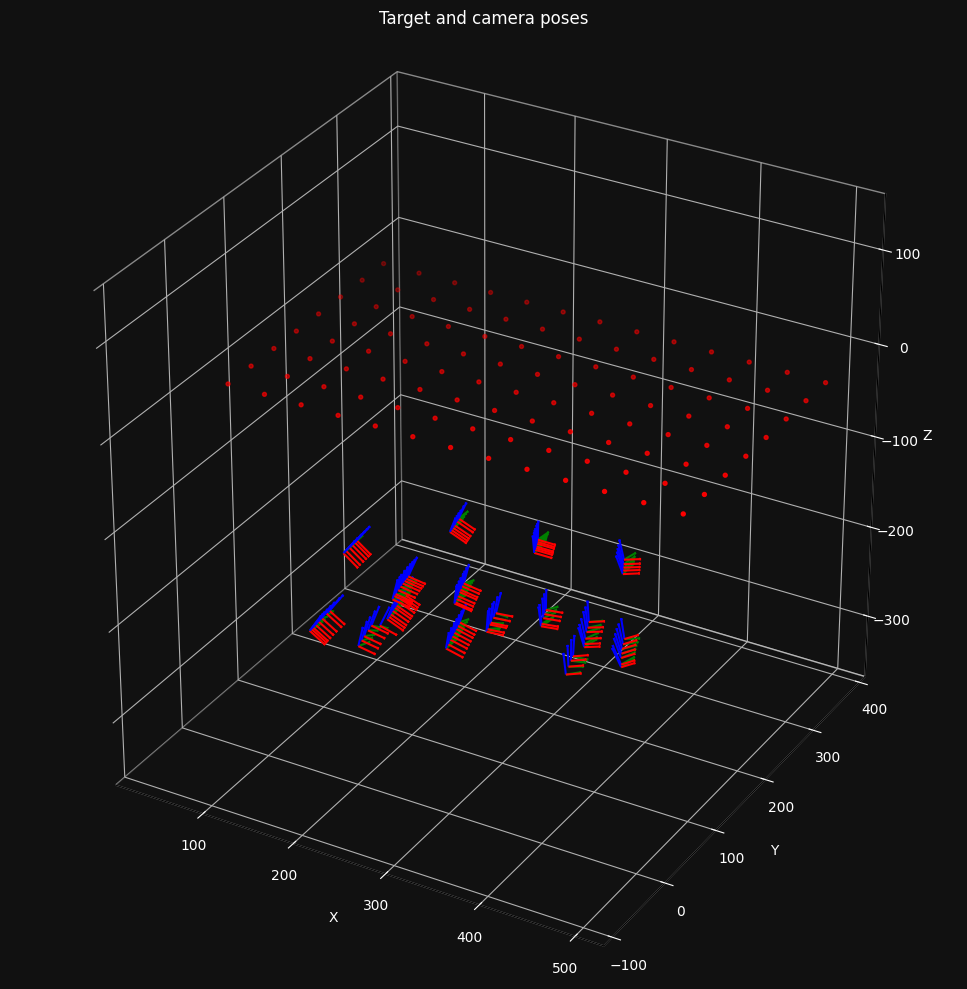

In [9]:
calibration_result.plot_target_and_poses()

Looks about right. Let's sanity check that the reprojected target points look good in a random image:

""

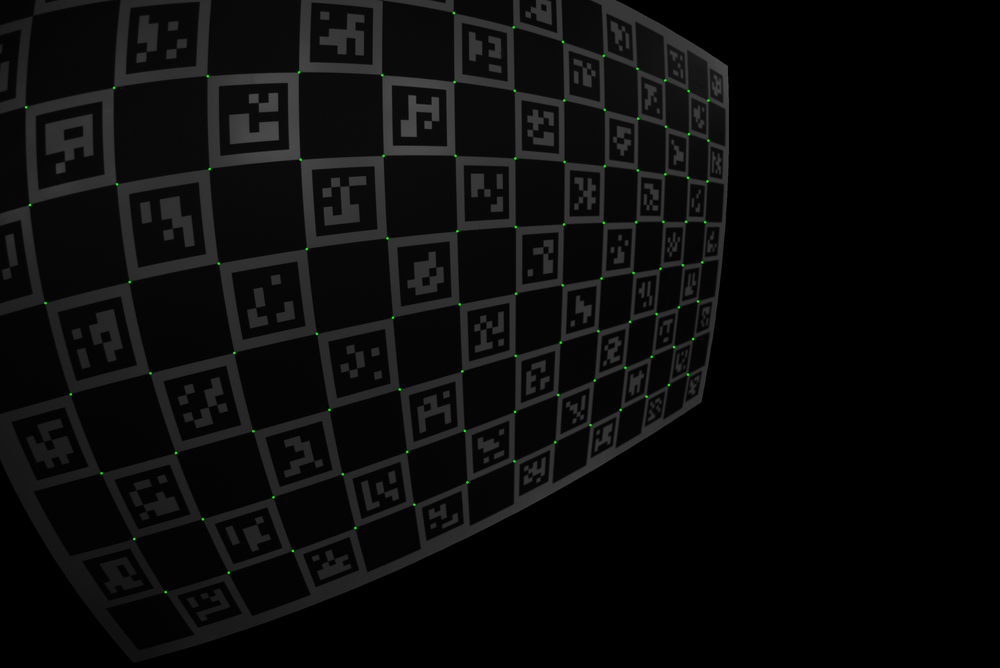

In [10]:
test_sample_idx = 0
diagnostic = calibration_result.frame_diagnostics[test_sample_idx]

# can be None if pnp failed for this sample
assert diagnostic is not None

projected_drawn = lba.draw_points(
    diagnostic.projected_points,
    image=used_imgs[test_sample_idx]
)

mediapy.show_image(projected_drawn, width=1000)

Looks good to me. Now let's visualize the lens distortion that the solve ended up with:

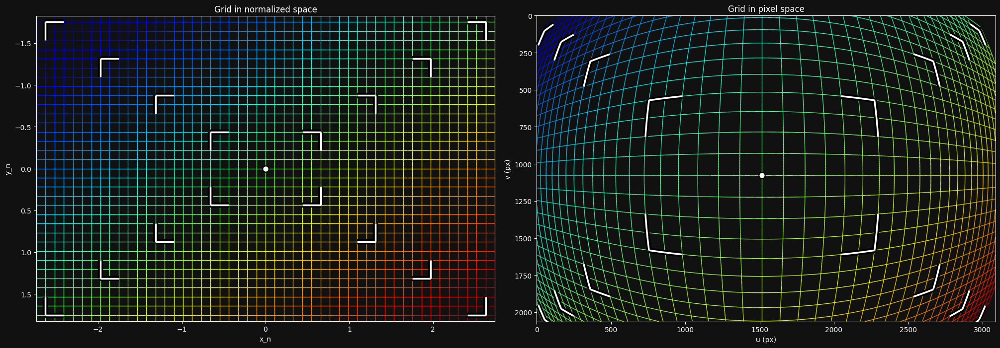

In [11]:
calibration_result.plot_distortion_grid()

The extreme distortion makes sense after looking at the images.

We should also make sure that the coverage of only the inliers is enough to constrain our model:

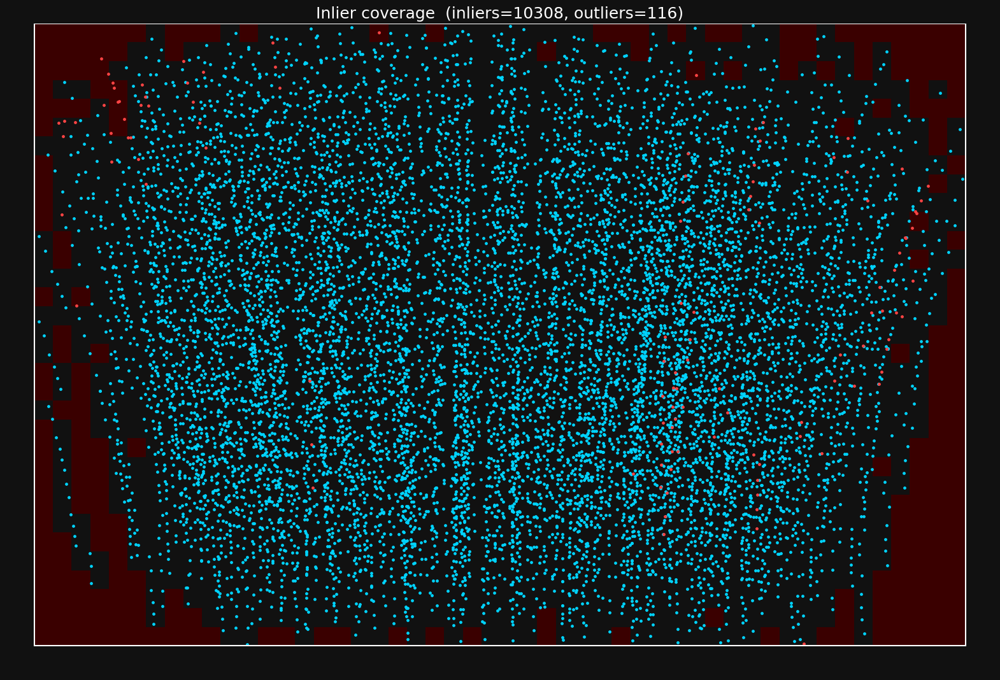

In [12]:
calibration_result.plot_inlier_coverage()

Looks good to me - the outlier filtering did not significantly affect our coverage.

Let's now plot the residuals of the solve:

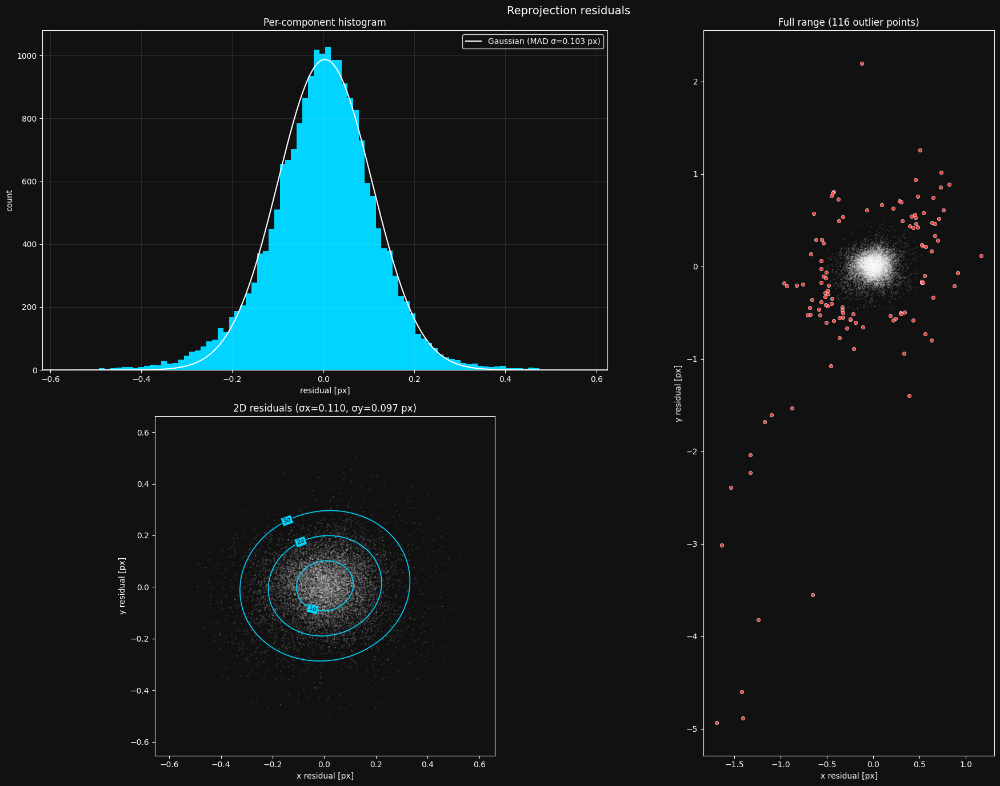

In [13]:
calibration_result.plot_residuals()

The residuals look pretty gaussian, and the spread is tight. Also, the 2D residuals look roughly isotropic, which is a good sign.

There are some pretty bad outliers. Let's first take a look at their distribution in the image:


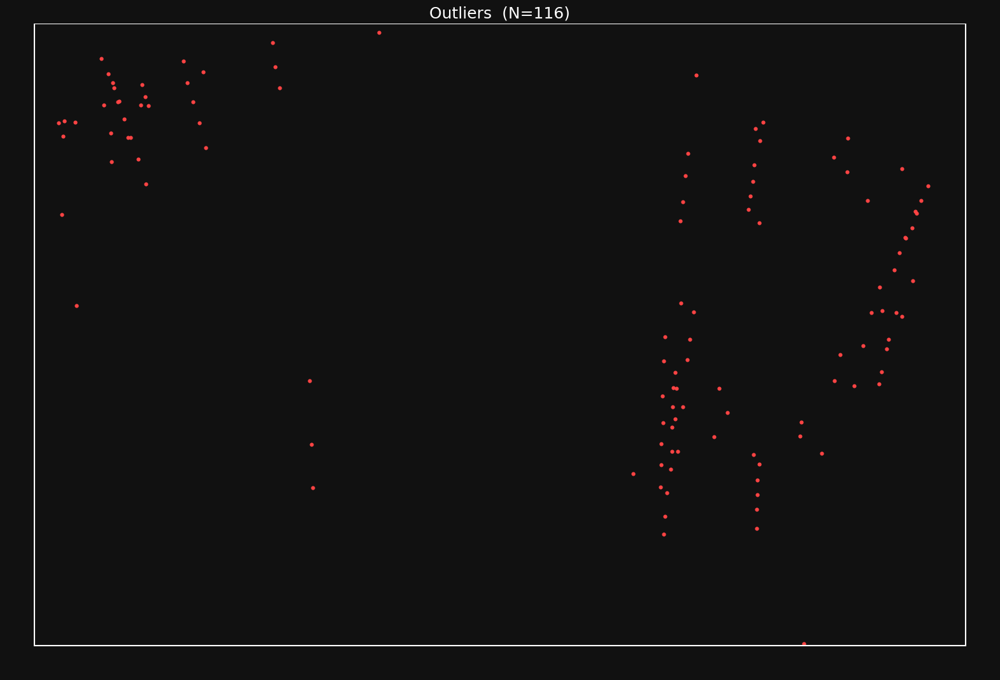

In [14]:
calibration_result.plot_outliers()

Looks reasonable.

Let's take a look at the per-image RMS plot to see where they happen:

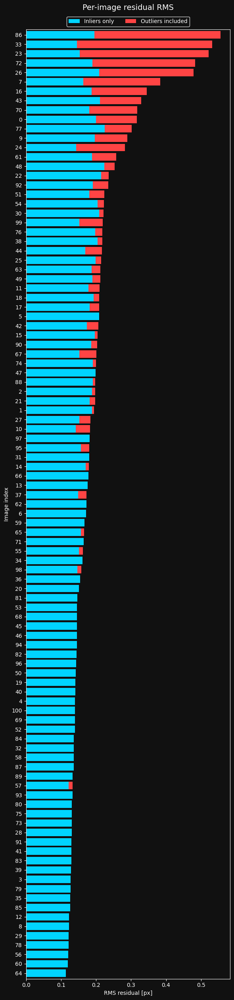

In [15]:
calibration_result.plot_per_image_rms()

Seems like some images have some particularly bad detections, but they're all filtered out as outliers. We can take a look at the worst ones:

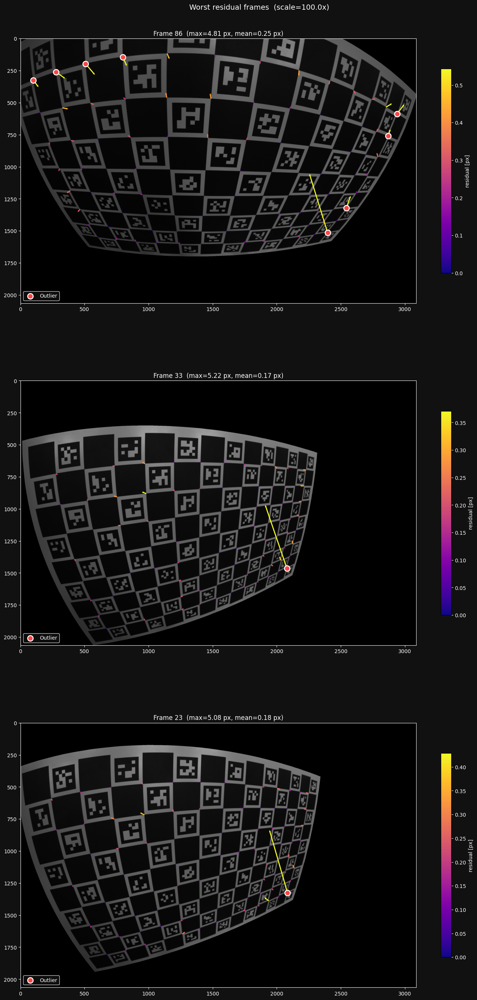

In [16]:
calibration_result.plot_worst_residual_frames(used_imgs, n=3)

This looks like some issue with the charuco detector when the board is very distorted - we will not worry about it here, since it's not too frequent, and the errors are filtered out as outliers.


Let's see if we can find any pattern in the residuals. The following plot is useful for this.

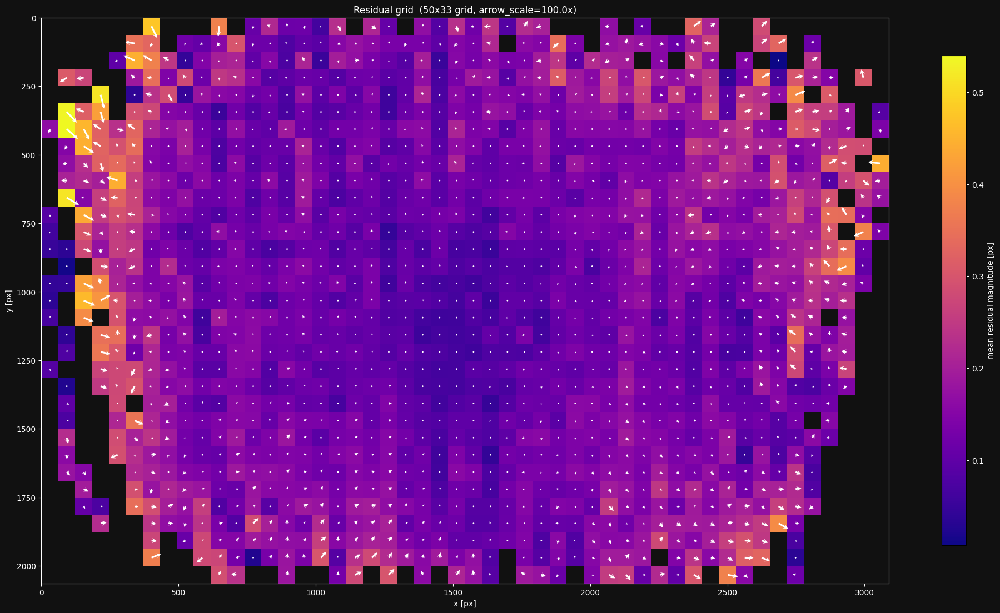

In [17]:
calibration_result.plot_residual_grid()

This plot shows the average magnitude of residuals in each cell, and plots the average residual as a vector.

Looks like the residuals are well-behaved in the center region, and become increasingly erroatic at the edges. 
My guesses for reasons for this are
* OpenCV models degrade slightly at the edges 
* The charuco detector might have some biases under extreme distortion
* We have less data to constrain the model in the edge regions. 

Since everything looks good in most of the image, I am happy with this model.

As mentioned earlier, the solver estimated the warp of the calibration target. We can take a look at this warp estimation:

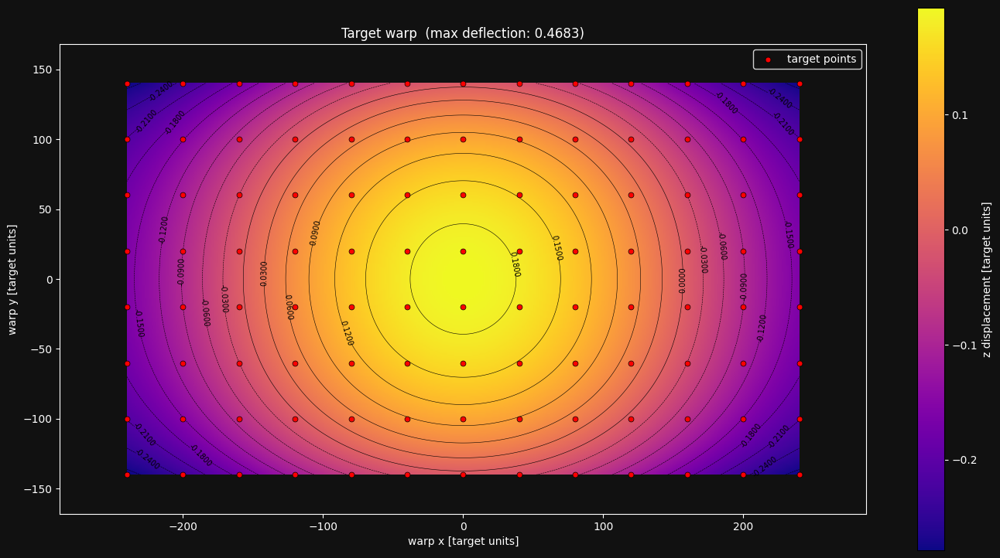

In [18]:
calibration_result.plot_target_warp()

Seems like the spread of the deflection is about 0.5mm. Not so bad, but if we solve without the warp, we get a worse fit:

Computing initial poses with PnP...
Auto-estimated initial focal length: 1500.9 px
PnP solved 101/101 frames
OpenCV pass 1: 0.6s (mean reproj=0.235px, worst=5.170px)
Outlier filtering: 89/10424 (0.9%) — re-optimizing...
OpenCV pass 2: 0.1s (mean reproj=0.222px, worst=0.998px)
Outlier filtering: 109/10424 (1.0%) — re-optimizing...
OpenCV pass 3: 0.1s (mean reproj=0.220px, worst=0.875px)


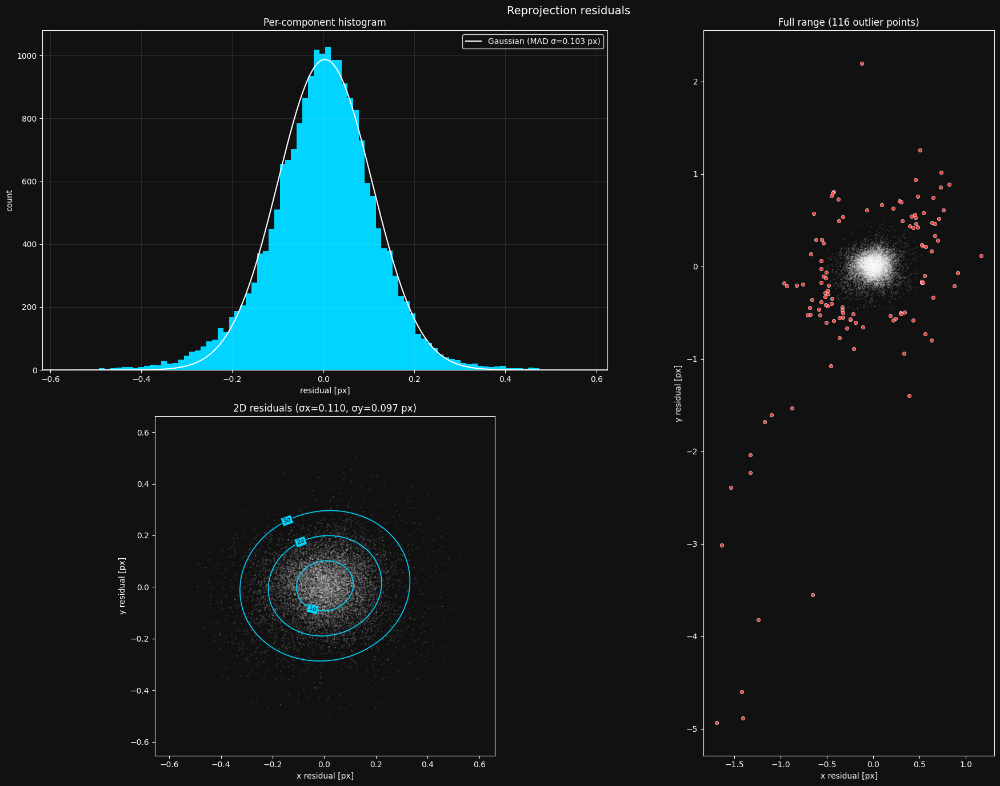

In [19]:

calibration_result_no_warp = lb.calibrate_camera(
    target_points,
    frames,
    camera_model_config=camera_model_config,
    estimate_target_warp=False
)
calibration_result.plot_residuals()

Comparing to the previous plot, this is clearly much worse.

# Save/load/use

When we are happy with our model, we can save it:

In [20]:
model_path = Path("../data/camera_models/opencv.json")
calibration_result.camera_model.save(model_path)

And then load it. I recommend just extracting the parameters to use in your application, this library is focused on calibration, not runtime use.

In [21]:
recovered_intrinsics = lb.OpenCV.load(model_path)

# grab the params to use in your application
image_width = recovered_intrinsics.image_width
image_height = recovered_intrinsics.image_height
K = recovered_intrinsics.K()
dist_coeffs = recovered_intrinsics.distortion_coeffs

# Spline models

If opencv models are not capable of modeling your lens with adequate precision, lensboy offers much more flexible and powerful models that use B-splines to model lens distortion.

Let's calibratre such a lens model here.

In [22]:
spline_model_config = lb.PinholeSplinedConfig(
    img_height,
    img_width,
    num_knots_x=30,
    num_knots_y=20
)

In [23]:
spline_calibration_result = lb.calibrate_camera(
    target_points,
    frames,
    camera_model_config=spline_model_config
)

Fitted OpenCV seed model: 0.5s (FOV: 139.8° x 122.4°)
Spline FOV estimate: 0.4s (143.5° x 127.6°)
PnP solved 101/101 frames
Spline pass 1: 2.2s (mean reproj=0.128px, worst=4.967px)
Outlier filtering: 119/10424 (1.1%) — re-optimizing...
Spline pass 2: 1.3s (mean reproj=0.114px, worst=0.574px)
Outlier filtering: 156/10424 (1.5%) — re-optimizing...
Spline pass 3: 0.8s (mean reproj=0.112px, worst=0.611px)
Target warp max deflection: 0.4769 (target units)


Let's look at the residual analysis:

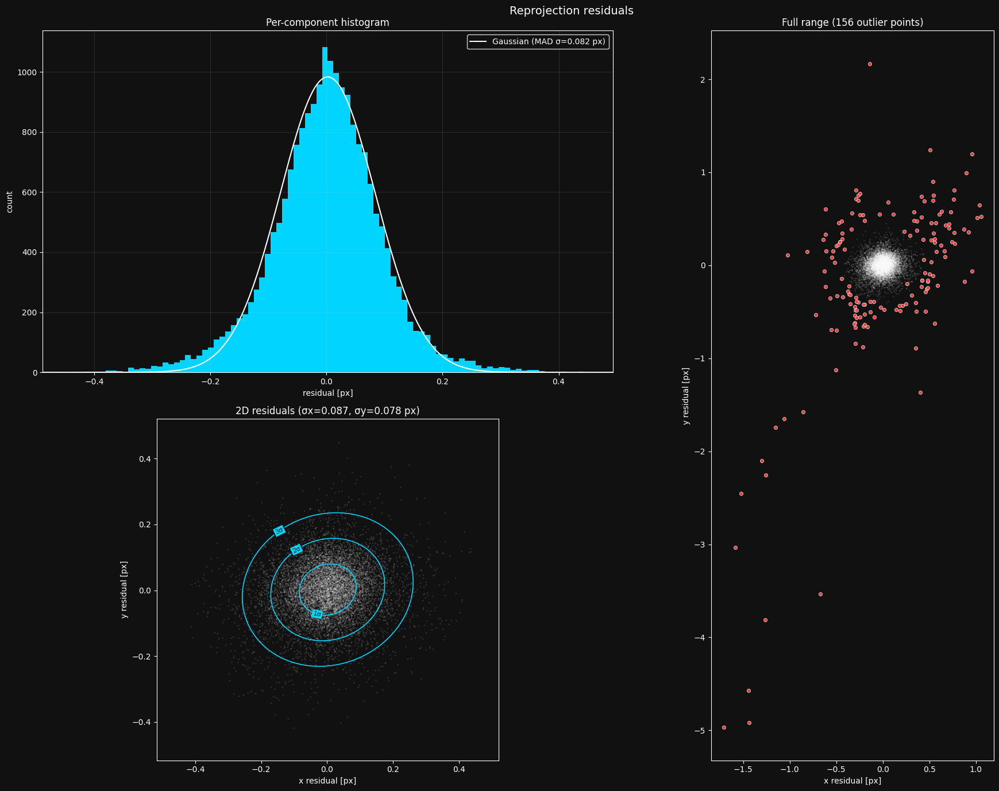

In [24]:
spline_calibration_result.plot_residuals()

We clearly see a better fit than the opencv model. However, I'm using a lens with good optics and clean distortion, so the difference is not too pronounced here.

Let's take a look at the distortion:

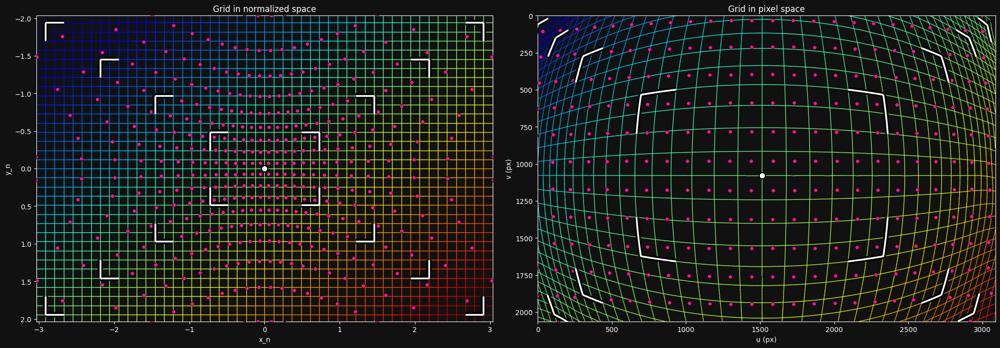

In [25]:
spline_calibration_result.plot_distortion_grid()

Let's see the residual grid:

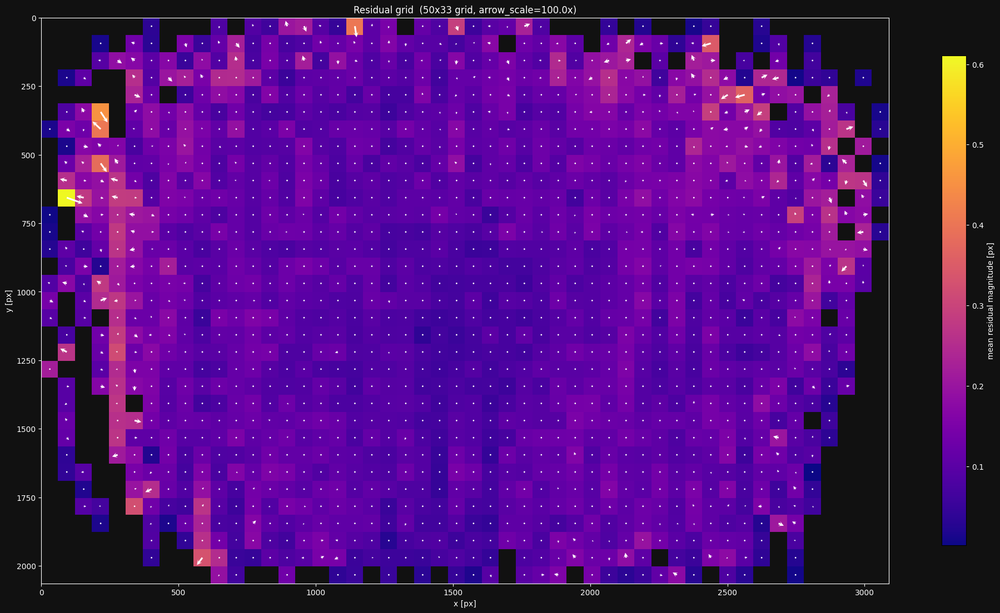

In [26]:
spline_calibration_result.plot_residual_grid()

Here the power of the spline model is clear - it is able to capture the lens distortion much better on the edges of the image. 

# Save/load/use
You can save and load spline models just like opencv models:


In [27]:
model_path = Path("../data/camera_models/spline.json")
spline_calibration_result.camera_model.save(model_path)
spline_intrinsics = lb.PinholeSplined.load(model_path)

Since lensboy's spline model is not supported anywhere you need to use it a bit differently.

The difference in use is that you need to undistort your images before using the camera model for most applications. 

For this purpose, we support converting the splined lens model to simple pinhole intrniscs along with undistortion maps:

In [28]:
pinhole_remapped = spline_intrinsics.get_pinhole_model()

Let's see how this undistorts the image:

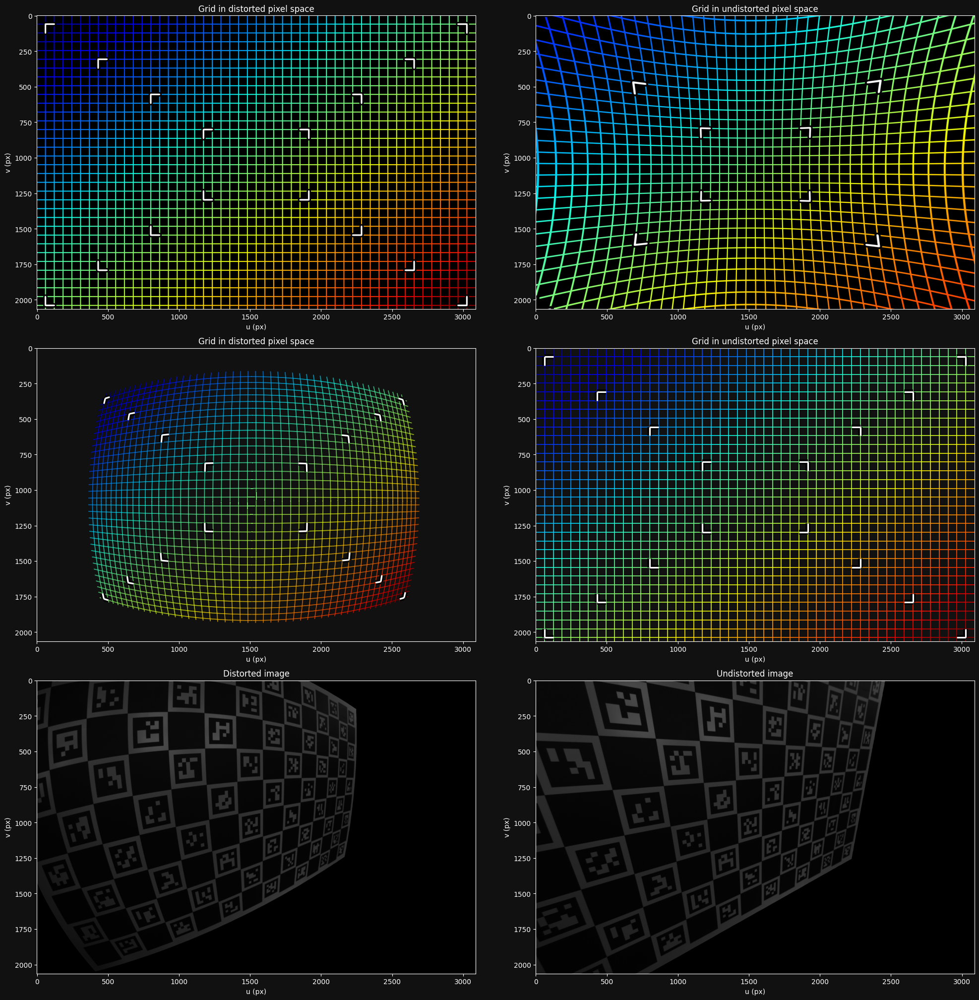

In [29]:
lba.plot_undistortion(pinhole_remapped, image=used_imgs[0])

This gives us a good feeling for the undistortion. It's clear we are cutting off a large part of the field of view of the original image here. The reason is that `get_pinhole_model` defaults to using the same focal length and principal point as the spline model. 

This makes it necessary to tune the export a bit. You can provide custom pinhole parameters and image sizes into `get_pinhole_model`:

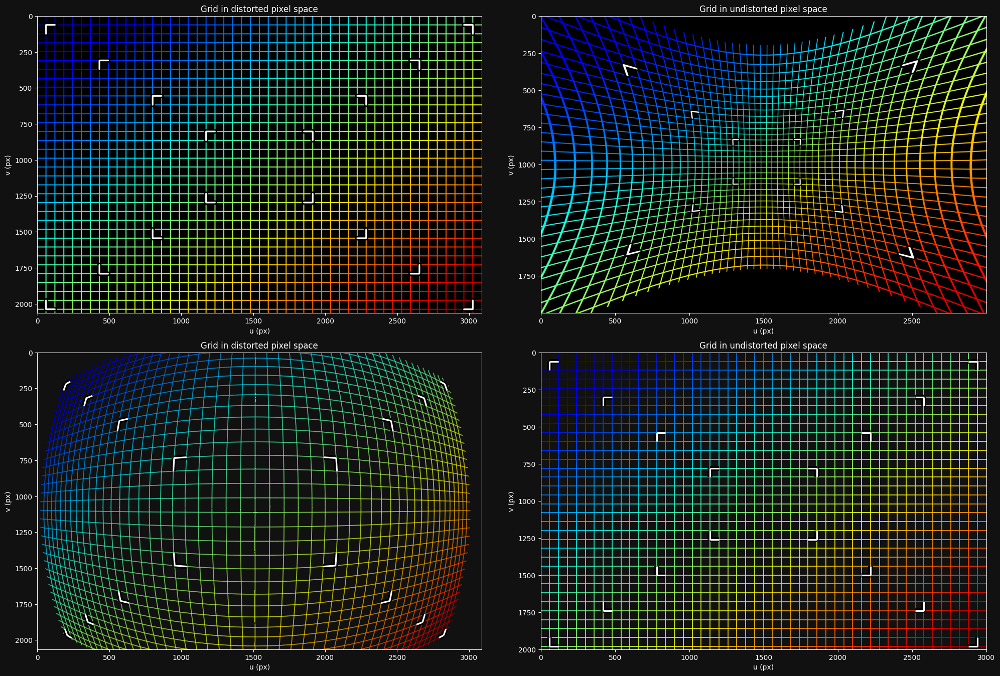

In [30]:
pinhole_remapped = spline_intrinsics.get_pinhole_model(
    fx=800, 
    fy=800, 
    cx=1500,
    cy=1000, 
    image_size_wh=(3000, 2000)
)
lba.plot_undistortion(pinhole_remapped)

Again, the strangeness at the edges is a result of the powerful spline model behaving erratically when it's not constrained by the data.

This preserves more of the field of view. Additional functions you can use are `get_pinhole_model_fov` if you have a specific fov in mind, or `get_pinhole_model_alpha`, which calculates your pinhole parameters based on how much data you are okay with losing, trading off with black areas:

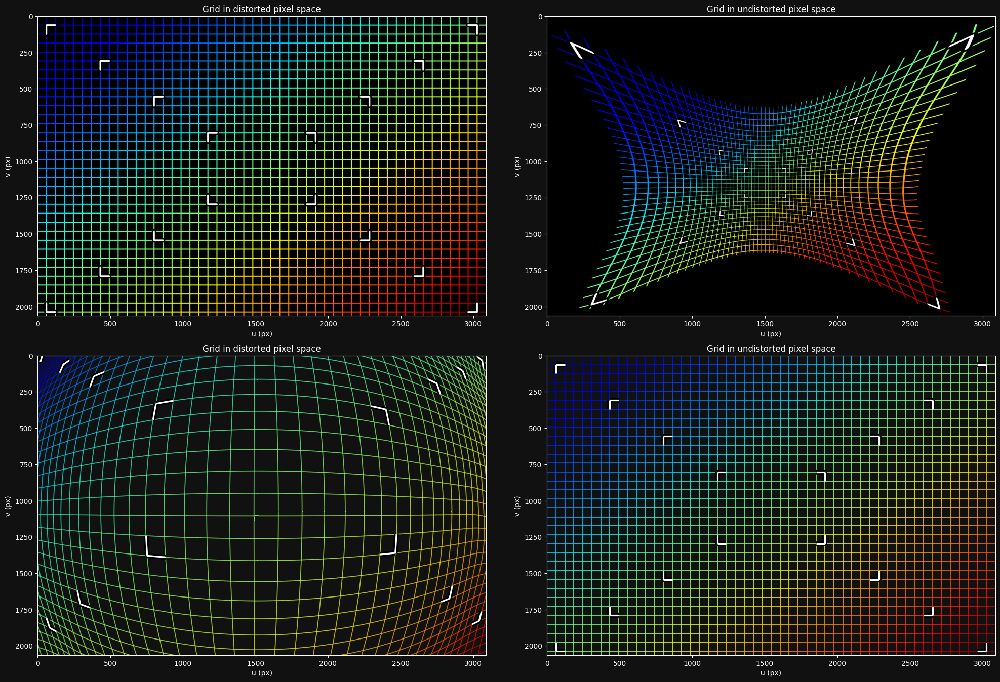

In [31]:
pinhole_remapped_alpha_1 = spline_intrinsics.get_pinhole_model_alpha(alpha=1.0)
lba.plot_undistortion(pinhole_remapped_alpha_1)

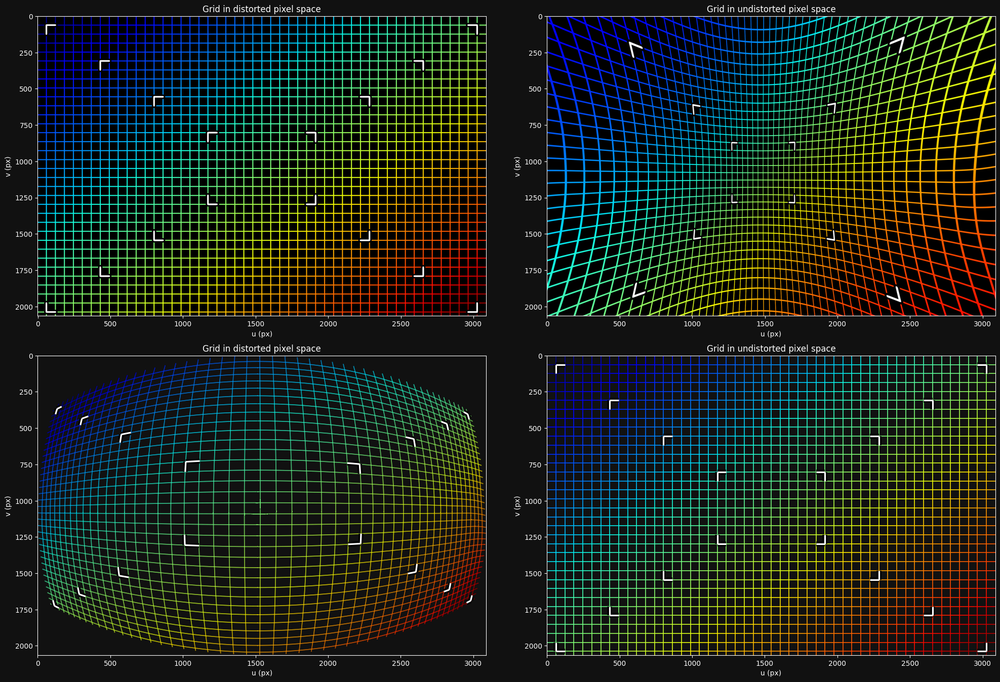

In [32]:
pinhole_remapped_alpha_0 = spline_intrinsics.get_pinhole_model_alpha(alpha=0.0)
lba.plot_undistortion(pinhole_remapped_alpha_0)

After choosing your undistortion model, the attributes of the `PinholeRemapped` are everything you need to use this cameramodel with other tools. 

I would recommend storing the `PinholeSplined` model on disk or database or whatever, and then only exporting to a `PinholeRemapped` after loading it in your application, since the remaps can be quite big, while the splined model is small.

Here is an example of loading a splined model and using it. First grab some example data:

In [33]:
img = imgs[0]

# We'll project the target points in this example
points_in_world = target_points
# let's apply warp if we optimized for warp
if spline_calibration_result.target_warp is not None:
    points_in_world = spline_calibration_result.target_warp.warp_target(target_points)

camera_from_target = spline_calibration_result.cameras_from_target[0]
assert camera_from_target is not None

points_in_camera = camera_from_target.apply(points_in_world)

Now we'll undistort and project:

""

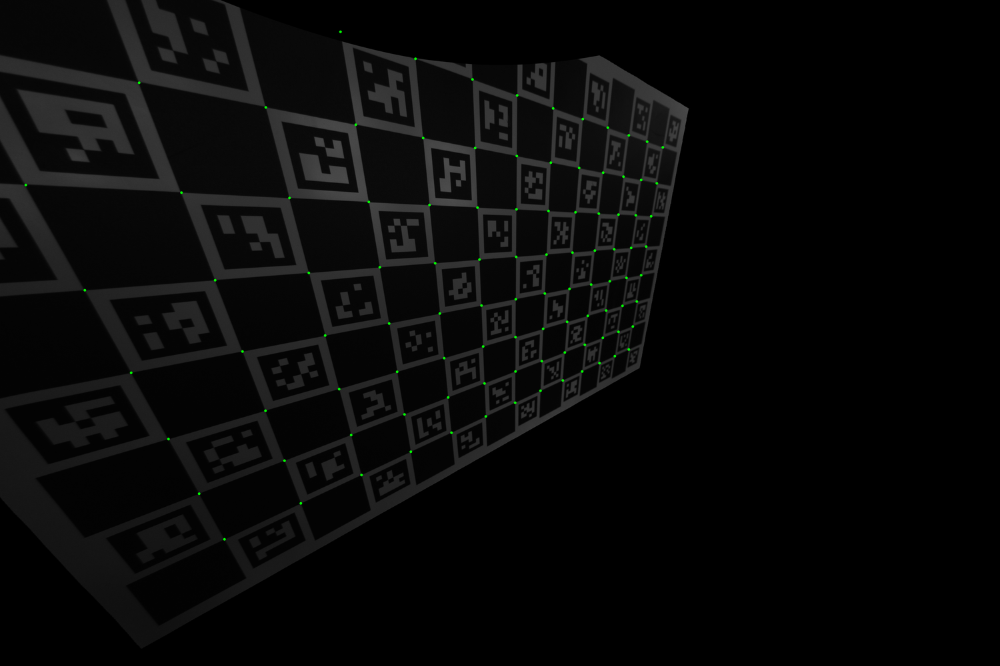

In [34]:
spline_intrinsics = lb.PinholeSplined.load(model_path)

pinhole_remapped = spline_intrinsics.get_pinhole_model(
    fx=800, 
    fy=800, 
    cx=1500, 
    cy=1000, 
    image_size_wh=(3000, 2000)
)
undistorted_image = pinhole_remapped.undistort(img)

projected = pinhole_remapped.project_points(points_in_camera)

display_img = lba.draw_points(projected, image=undistorted_image)
mediapy.show_image(display_img, width=1500)

# Model differencing
`lensboy` offers tools to compare two different camera models. See [model_comparison.ipynb](./model_comparison.ipynb) for more.

As a demo, let's see how the opencv and spline models differ:

Implied rotation: x=0.0704 y=0.0271 z=-0.0078 deg
Implied translation: [ 4.42732113e-07 -1.21037749e-06  9.15311649e-09]


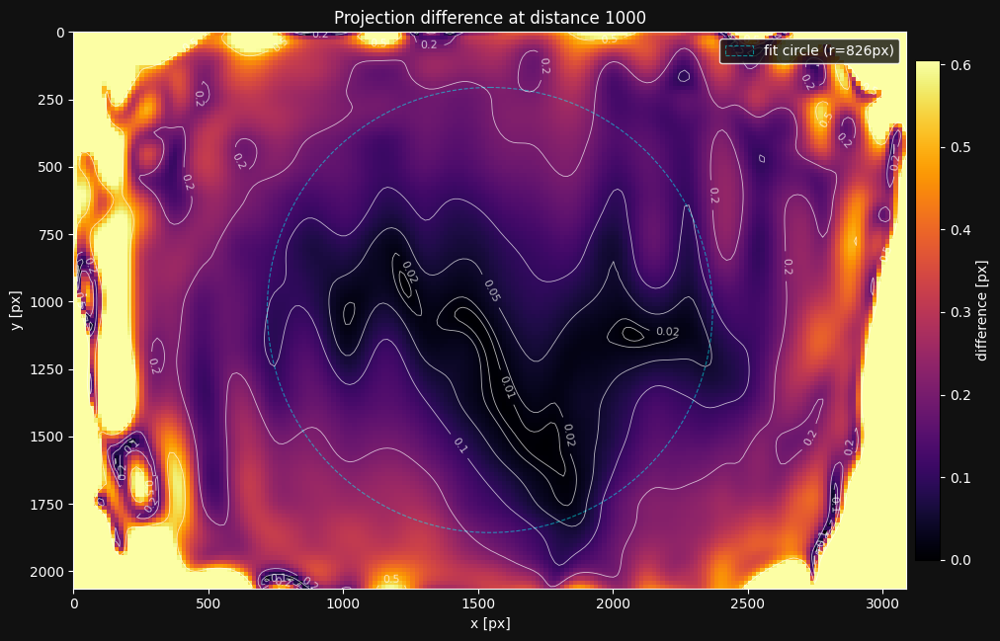

In [35]:
lba.plot_projection_diff(calibration_result.camera_model, spline_intrinsics, distance=1000)

This can be useful to, for example
* Cross-validate your calibration
* Check whether your camera calibrtion has changed
* Compare two cameras of the same type to see how much the intrinsics differ